# Pruebas Preprocesamiento Imágenes.

## Librerías:

In [1]:
# Tratamiento datos
import pandas as pd
import numpy as np
from collections import Counter
import time

# Organizar rutas imágenes
import os
import random

# Lectura tomografías. 
import nibabel as nib # Lectura
from scipy import ndimage # Tratamiento

# Modelado
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

# Data Augmentation
from volumentations import *

pd.set_option('display.max_columns', 500)
pd.set_option('display.float_format', lambda x: f'{x:.3f}')
#pd.set_option('display.float_format', lambda x: f'{x:,.3f}') #add a comma separator between the thousands.
pd.set_option('display.max_colwidth',1000)



np.set_printoptions(threshold=1000, linewidth = 300, edgeitems = 5)
np.set_printoptions(suppress=True)


import pickle

c:\Users\Juan Fierro\anaconda3\envs\ML\lib\site-packages\numpy\_distributor_init.py:30: UserWarning: loaded more than 1 DLL from .libs:
c:\Users\Juan Fierro\anaconda3\envs\ML\lib\site-packages\numpy\.libs\libopenblas.EL2C6PLE4ZYW3ECEVIV3OXXGRN2NRFM2.gfortran-win_amd64.dll
c:\Users\Juan Fierro\anaconda3\envs\ML\lib\site-packages\numpy\.libs\libopenblas64__v0.3.21-gcc_10_3_0.dll
  warnings.warn("loaded more than 1 DLL from .libs:"
c:\Users\Juan Fierro\anaconda3\envs\ML\lib\site-packages\scipy\__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.4
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


## Parámetros

In [6]:
ambiente = 'LOCAL' # 'GOOGLE' o 'LOCAL'

## Ejemplo Dimensiones

In [3]:
array_test = np.random.randint(20,size = (2,3,4))
array_test = np.array([[[1, 2, 3, 4], [5, 6, 7, 8], [9, 10, 11, 12]],
                    [[13, 14, 15, 16], [17, 18, 19, 20], [21, 22, 23, 24]]])
print(array_test.shape)
array_test

(2, 3, 4)


array([[[ 1,  2,  3,  4],
        [ 5,  6,  7,  8],
        [ 9, 10, 11, 12]],

       [[13, 14, 15, 16],
        [17, 18, 19, 20],
        [21, 22, 23, 24]]])

In [4]:
array_test[:,:,0]

array([[ 1,  5,  9],
       [13, 17, 21]])

In [5]:
array_test[:,:,1]

array([[ 2,  6, 10],
       [14, 18, 22]])

In [6]:
array_test[:,:,0].reshape(2*3)

array([ 1,  5,  9, 13, 17, 21])

In [7]:
array_test[:,:,0].flatten()

array([ 1,  5,  9, 13, 17, 21])

In [8]:
array_test.flatten()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24])

In [9]:
np.squeeze(array_test[:, :, 0])

array([[ 1,  5,  9],
       [13, 17, 21]])

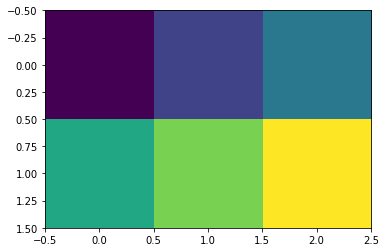

In [10]:
from matplotlib import pyplot as plt

plt.imshow(np.squeeze(array_test[:, :, 0]))

### Conversión 3D-2D

#### Reshape

In [11]:
array_test.reshape(array_test.shape[0], (array_test.shape[1]*array_test.shape[2]))

array([[ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12],
       [13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24]])

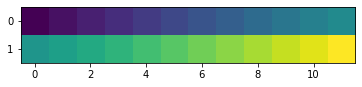

In [12]:
plt.imshow(array_test.reshape(array_test.shape[0], (array_test.shape[1]*array_test.shape[2])))

#### Suma

In [13]:
np.sum(array_test,axis=-1)

array([[10, 26, 42],
       [58, 74, 90]])

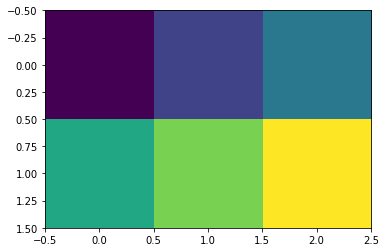

In [14]:
plt.imshow(np.sum(array_test,axis=-1))

#### Mean

In [15]:
np.mean(array_test,axis=-1)

array([[ 2.5,  6.5, 10.5],
       [14.5, 18.5, 22.5]])

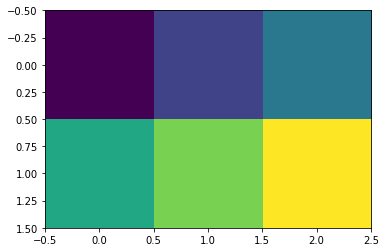

In [16]:
plt.imshow(np.mean(array_test,axis=-1))

#### Otro

In [17]:
array_test.shape

(2, 3, 4)

In [18]:
array_test

array([[[ 1,  2,  3,  4],
        [ 5,  6,  7,  8],
        [ 9, 10, 11, 12]],

       [[13, 14, 15, 16],
        [17, 18, 19, 20],
        [21, 22, 23, 24]]])

In [19]:
array_test[:, :, 0]

array([[ 1,  5,  9],
       [13, 17, 21]])

## Lectura Rutas Imgs

In [7]:
if ambiente == 'GOOGLE':
    print("Leyendo rutas de google")
    train_df = pd.read_csv(r'/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Path_Sets/train_df.csv')
    test_df = pd.read_csv(r'/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Path_Sets/test_df.csv')
    valid_df = pd.read_csv(r'/content/gdrive/MyDrive/Maestria//Tesis/Bayesian_NN/Data/Path_Sets/valid_df.csv')
    
    train_df['path'] = train_df['File_Path_Google']
    test_df['path'] = test_df['File_Path_Google']
    valid_df['path'] = valid_df['File_Path_Google']

else:
    print("Leyendo rutas del local")
    train_df = pd.read_csv(r'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Path_Sets/train_df.csv')
    test_df = pd.read_csv(r'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Path_Sets/test_df.csv')
    valid_df = pd.read_csv(r'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Path_Sets/valid_df.csv')

    train_df['path'] = train_df['File_Path']
    test_df['path'] = test_df['File_Path']
    valid_df['path'] = valid_df['File_Path']


Leyendo rutas del local


In [8]:
train_df

,File_Path,File_Path_Google,Label,path
0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0053.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0053.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0053.nii.gz
1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0195.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0195.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0195.nii.gz
2,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0010.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0010.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0010.nii.gz
3,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0009.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0009.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0009.nii.gz
4,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0050.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0050.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0050.nii.gz
...,...,...,...,...
290,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1089.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1089.nii.gz,1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1089.nii.gz
291,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1068.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1068.nii.gz,1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1068.nii.gz
292,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1104.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1104.nii.gz,1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1104.nii.gz
293,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1072.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1072.nii.gz,1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1072.nii.gz


In [9]:
test_df

,File_Path,File_Path_Google,Label,path
0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0094.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0094.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0094.nii.gz
1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0151.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0151.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0151.nii.gz
2,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0210.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0210.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0210.nii.gz
3,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0011.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0011.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0011.nii.gz
4,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0205.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0205.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0205.nii.gz
...,...,...,...,...
79,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1096.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1096.nii.gz,1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1096.nii.gz
80,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1088.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1088.nii.gz,1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1088.nii.gz
81,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1069.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1069.nii.gz,1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1069.nii.gz
82,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1106.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1106.nii.gz,1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1106.nii.gz


In [10]:
valid_df

,File_Path,File_Path_Google,Label,path
0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0026.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0026.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0026.nii.gz
1,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0031.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0031.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0031.nii.gz
2,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0180.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0180.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0180.nii.gz
3,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0075.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0075.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0075.nii.gz
4,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0139.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0139.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0139.nii.gz
5,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0100.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0100.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0100.nii.gz
6,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0092.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0092.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0092.nii.gz
7,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0114.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0114.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0114.nii.gz
8,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0243.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0243.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0243.nii.gz
9,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0178.nii.gz,/content/gdrive/MyDrive/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0178.nii.gz,0,G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0178.nii.gz


# Lectura Imágenes

## Lectura:

In [24]:
def read_nifti_file(filepath):
    """Read and load volume"""
    # Read file
    scan = nib.load(filepath)
    # Get raw data
    scan = scan.get_fdata()
    return scan


def normalize(volume, min_normalize, max_normalize):
    """Normalize the volume"""
    min = min_normalize #-1000
    max = max_normalize #400
    volume[volume < min] = min
    volume[volume > max] = max
    volume = (volume - min) / (max - min)
    volume = volume.astype("float32")
    return volume


def resize_volume(img):
    """Resize across z-axis"""
    # Set the desired depth
    desired_depth = 64
    desired_width = 128
    desired_height = 128
    # Get current depth
    current_depth = img.shape[-1]
    current_width = img.shape[0]
    current_height = img.shape[1]
    # Compute depth factor
    depth = current_depth / desired_depth
    width = current_width / desired_width
    height = current_height / desired_height
    depth_factor = 1 / depth
    width_factor = 1 / width
    height_factor = 1 / height
    # Resize across z-axis
    img = ndimage.zoom(img, (width_factor, height_factor, depth_factor), order=1)
    # Rotate
    img = ndimage.rotate(img, 90, reshape=False)
    return img


def process_scan(path, min_normalize, max_normalize):
    """Read and resize volume"""
    # Read scan
    volume = read_nifti_file(path)
    # Normalize
    volume = normalize(volume, min_normalize=min_normalize, max_normalize=max_normalize)
    # Resize width, height and depth
    volume = resize_volume(volume)
    return volume


## Leyendo y visualizando tomografías

In [14]:
import matplotlib.pyplot as plt
import re

In [21]:
min_ventana = -1000
max_ventana = 0


### Tomografía normal

File: G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0053.nii.gz. -- Etiqueta: 0
Dim Imagen: (128, 128, 64). Min Píxeles: -0.000. Max Píxeles: 1.000. Media Píxeles: 0.543. Suma Píxeles: 569158.625


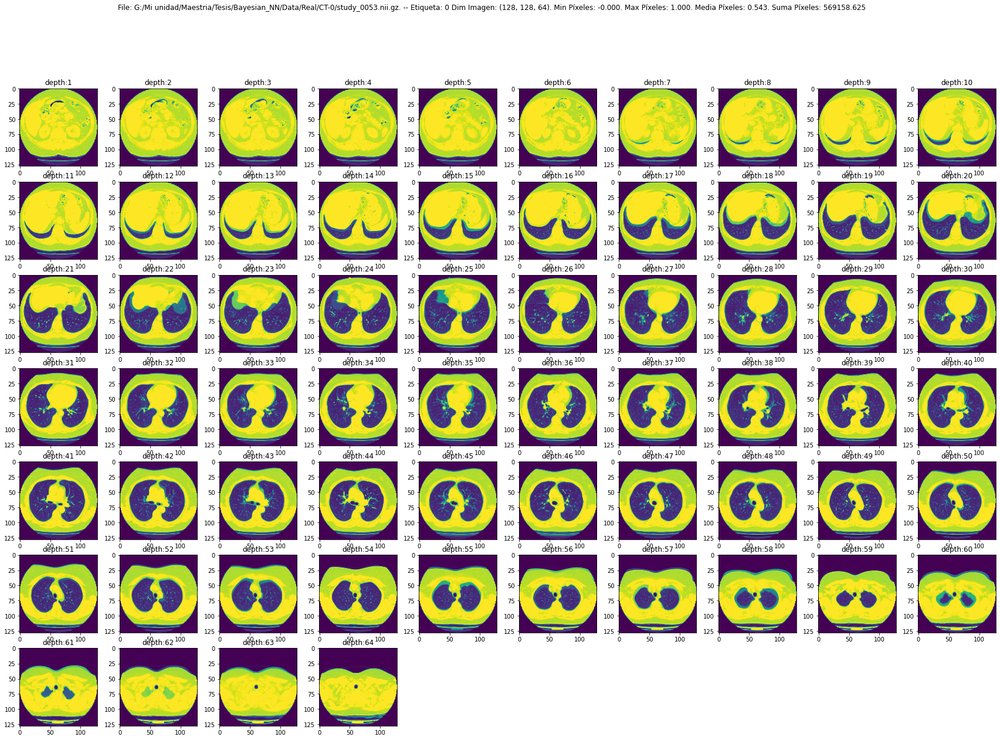

In [27]:
index = 0
file_example = train_df['File_Path'][index]
label_example = train_df['Label'][index]
mensaje0 = f"File: {file_example}. -- Etiqueta: {label_example}"
print(mensaje0)
test_image = process_scan(file_example, min_normalize= min_ventana, max_normalize=max_ventana)
mensaje1 = f"Dim Imagen: {test_image.shape}. Min Píxeles: {'{:.3f}'.format(test_image.min())}. Max Píxeles: {'{:.3f}'.format(test_image.max())}. Media Píxeles: {'{:.3f}'.format(test_image.mean())}. Suma Píxeles: {'{:.3f}'.format(test_image.sum())}"
print(mensaje1)

file_image_path = re.findall(r'study_[\d]+', file_example)[0]
type_image = "original"
file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/{type_image}_{file_image_path}_Class{label_example}_Rango{min_ventana}_{max_ventana}.png'
file_image_path

img_print = test_image
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img)
plt.suptitle(mensaje0 + " " + mensaje1)
plt.savefig(file_image_path)
plt.show()

### Tomografía con anomalías

File: G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-3/study_1093.nii.gz. -- Etiqueta: 1
Dim Imagen: (128, 128, 64). Min Píxeles: -0.000. Max Píxeles: 1.000. Media Píxeles: 0.577. Suma Píxeles: 604882.125


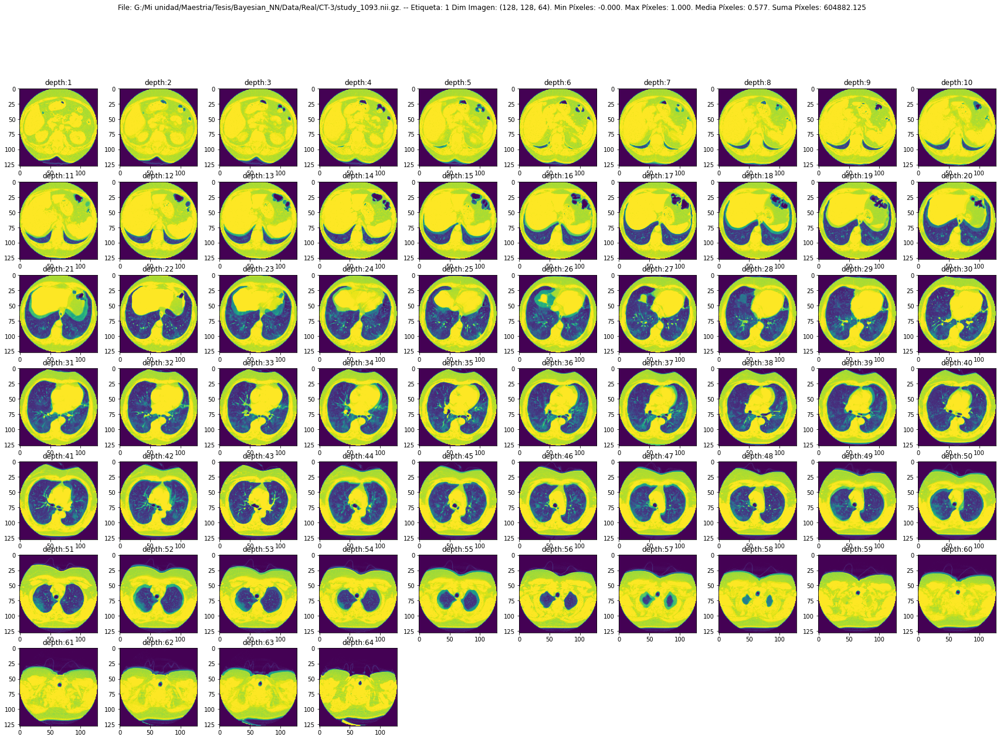

In [28]:
index = 294
file_example = train_df['File_Path'][index]
label_example = train_df['Label'][index]
mensaje0 = f"File: {file_example}. -- Etiqueta: {label_example}"
print(mensaje0)
test_image = process_scan(file_example, min_normalize= min_ventana, max_normalize=max_ventana)
mensaje1 = f"Dim Imagen: {test_image.shape}. Min Píxeles: {'{:.3f}'.format(test_image.min())}. Max Píxeles: {'{:.3f}'.format(test_image.max())}. Media Píxeles: {'{:.3f}'.format(test_image.mean())}. Suma Píxeles: {'{:.3f}'.format(test_image.sum())}"
print(mensaje1)

file_image_path = re.findall(r'study_[\d]+', file_example)[0]
type_image = "original"
file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/{type_image}_{file_image_path}_Class{label_example}_Rango{min_ventana}_{max_ventana}.png'
file_image_path

img_print = test_image
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img)
plt.suptitle(mensaje0 + " " + mensaje1)
plt.savefig(file_image_path)
plt.show()

### Visualización 3D

In [29]:
import numpy as np
import nibabel as nib
from mayavi import mlab
from tvtk.util.ctf import PiecewiseFunction

index = 0
min_ventana = -1000
max_ventana = 0
file_example = train_df['File_Path'][index]
label_example = train_df['Label'][index]
mensaje0 = f"File: {file_example}. -- Etiqueta: {label_example}"
print(mensaje0)
test_image = process_scan(file_example, min_normalize= min_ventana, max_normalize=max_ventana)
mensaje1 = f"Dim Imagen: {test_image.shape}. Min Píxeles: {'{:.3f}'.format(test_image.min())}. Max Píxeles: {'{:.3f}'.format(test_image.max())}. Media Píxeles: {'{:.3f}'.format(test_image.mean())}. Suma Píxeles: {'{:.3f}'.format(test_image.sum())}"
print(mensaje1)

# Get the image data as a NumPy array
#ct_scan_data = nii_img.get_fdata()
ct_scan_data = test_image

# Set up the mayavi figure
mlab.figure(bgcolor=(1, 1, 1))

# Create the volume rendering visualization
vol = mlab.pipeline.volume(mlab.pipeline.scalar_field(ct_scan_data))

# Get the volume property
volume_property = vol._volume_property

# Adjust the opacity transfer function for better visualization
opacity_tf = PiecewiseFunction()
opacity_tf.add_point(0, 0)
opacity_tf.add_point(np.max(ct_scan_data), 1)
volume_property.set_scalar_opacity(opacity_tf)

# Display the 3D plot
mlab.show()


File: G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0053.nii.gz. -- Etiqueta: 0
Dim Imagen: (128, 128, 64). Min Píxeles: -0.000. Max Píxeles: 1.000. Media Píxeles: 0.543. Suma Píxeles: 569158.625


# Prueba Lectura TF

In [30]:
min_ventana = -950
max_ventana = 550

In [31]:
def load_arrays(path):
    print(path.numpy().decode())
    image_ = nib.load(path.numpy().decode())
    image_ = image_.get_fdata()
    image = normalize(image_, min_normalize=min_ventana, max_normalize=max_ventana) 
    image = resize_volume(image)[..., None] #Agregar dimensión grises
    return image#.reshape(image_.shape+(1,))

def tf_data_array(filenames1, labels):
    [image,] = tf.py_function(func= load_arrays,  inp=[filenames1], Tout=[tf.float32])
    image.set_shape((128,128,64,1))
    #labels.set_shape(label.shape)
    return image,  labels

In [32]:
BATCH_SIZE=2
RANDOM = 9411
def datasets_iteration(dataset_row, training=False):
    filename = dataset_row['path']
    labels = dataset_row['Label']
    dataset = tf.data.Dataset.from_tensor_slices((filename,labels))
    
    print(dataset)

    if training:
        dataset = dataset.shuffle(len(dataset_row),seed=RANDOM)
    #dataset = dataset.map(tf_data_array).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    #dataset = dataset.map(tf_data_array).cache().batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    dataset = dataset.map(tf_data_array).batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)
    return dataset

In [33]:
train_dataset = datasets_iteration(valid_df)

<TensorSliceDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [34]:
data = train_dataset.take(-1) # Tomamos todos los batchs
data2 = list(data)


G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0026.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0031.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0180.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0075.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0139.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0100.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0092.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0114.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0243.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0178.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0133.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0056.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0020.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/C

In [35]:
for i in range(23): # Como son 45 datos. Los batches son 22.5 ~ 23. Cada uno de 2 imágenes.
    print(i)
    images, labels = data2[i]
    print("Dimension of data:", labels) # La cantidad de valores en el tensor son el número de imágenes que hay (batch_size) y los números corresponden a las clases.



0
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
1
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
2
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
3
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
4
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
5
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
6
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
7
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
8
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
9
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
10
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
11
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
12
Dimension of data: tf.Tensor([0 0], shape=(2,), dtype=int64)
13
Dimension of data: tf.Tensor([0 1], shape=(2,), dtype=int64)
14
Dimension of data: tf.Tensor([1 1], shape=(2,), dtype=int64)
15
Dimension of data: tf.Tensor([1 1], shape=(2,),

In [36]:
images, labels = data2[13] # Se escoge el batch 13 porque en el print anterior se ve que es donde podemos encontrar un 0 y 1 en etiquetas.
images = images.numpy()

Dimension of data: Etiqueta 0  -- Etiquetas tf.Tensor([0 1], shape=(2,), dtype=int64)
Dimension of the CT scan is: (128, 128, 64, 1)


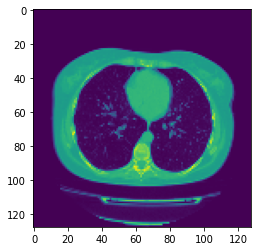

In [37]:
index = 0
image = images[index]
label = labels.numpy()[index]
print("Dimension of data: Etiqueta", label, " -- Etiquetas",labels) # La cantidad de valores en el tensor son el número de imágenes que hay (batch_size) y los números corresponden a las clases.
print("Dimension of the CT scan is:", image.shape)
plt.imshow(np.squeeze(image[:, :, 30]))#, cmap="gray")

Dimension of data: Etiqueta 1  -- Etiquetas tf.Tensor([0 1], shape=(2,), dtype=int64)
Dimension of the CT scan is: (128, 128, 64, 1)


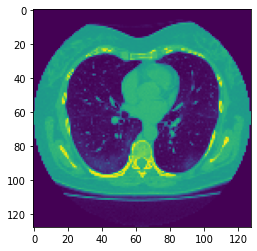

In [38]:
index = 1
image1 = images[index]
label1 = labels.numpy()[index]
print("Dimension of data: Etiqueta", label1, " -- Etiquetas",labels) # La cantidad de valores en el tensor son el número de imágenes que hay (batch_size) y los números corresponden a las clases.
print("Dimension of the CT scan is:", image1.shape)
plt.imshow(np.squeeze(image1[:, :, 30]))#, cmap="gray")

CT Etiqueta: 0 
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/TF_Class0_Rango-950_550.png


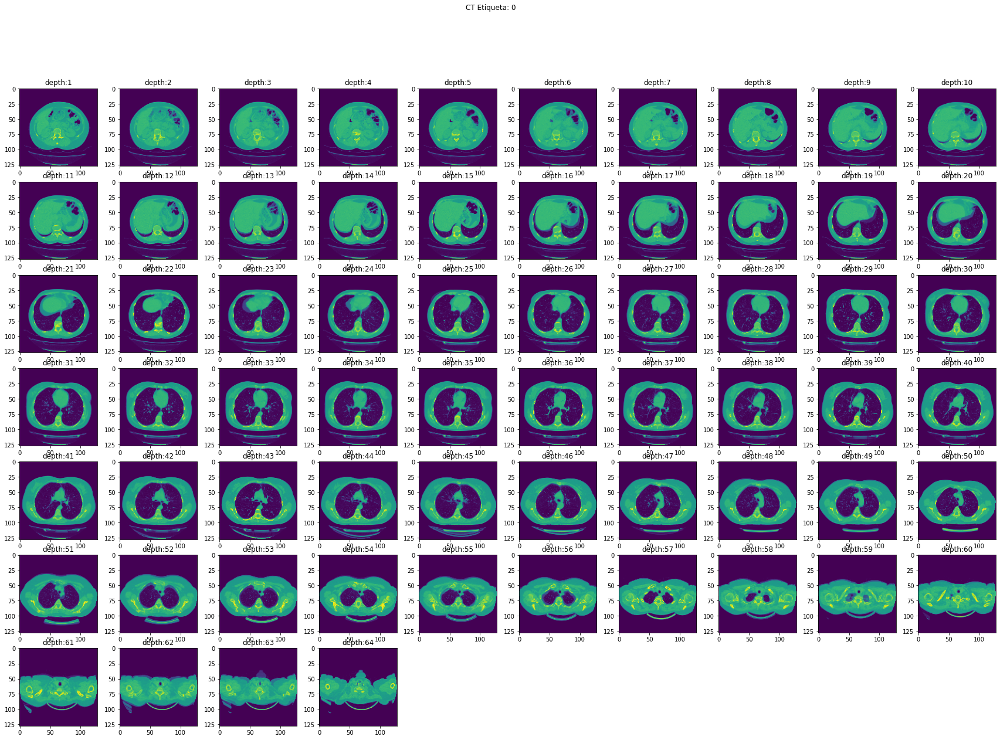

In [39]:
index_ct = 0
mensaje = f"CT Etiqueta: {labels.numpy()[index_ct]} "
print(mensaje)
img_print = images[index_ct]
label_print = labels.numpy()[index_ct]
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/TF_Class{label_print}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)


# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img)
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

CT Etiqueta: 1 
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/TF_Class1_Rango-950_550.png


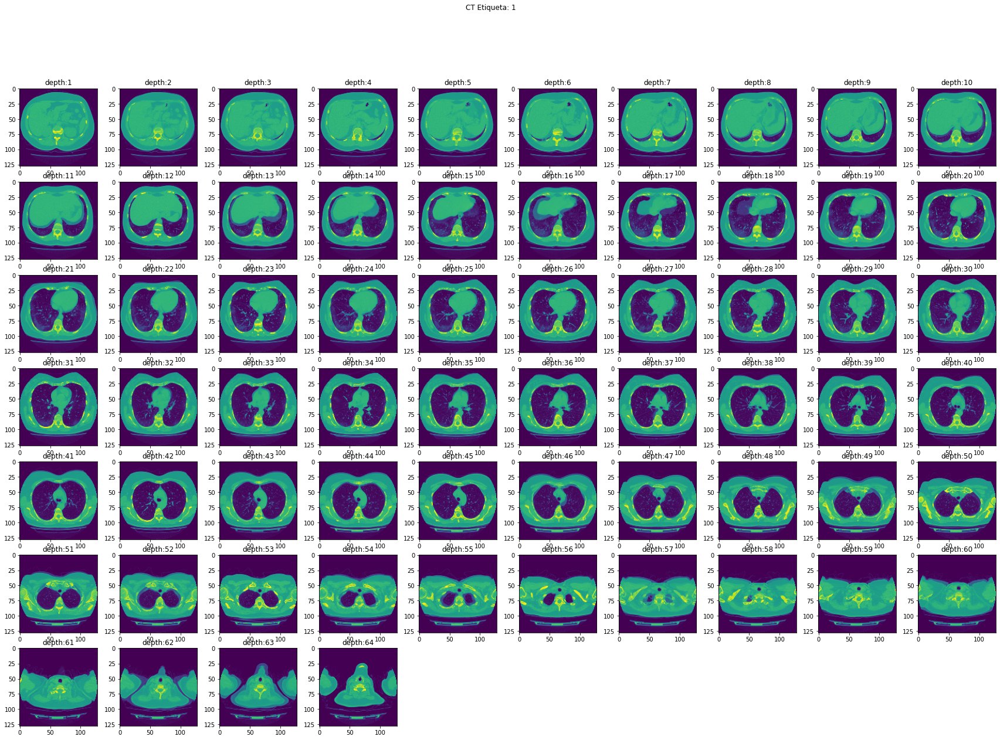

In [40]:
index_ct = 1
mensaje = f"CT Etiqueta: {labels.numpy()[index_ct]} "
print(mensaje)
img_print = images[index_ct]
label_print = labels.numpy()[index_ct]
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/TF_Class{label_print}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)


# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img)
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

## PRUEBA Modelo REDUCIDO con lectura TF 

In [ ]:
def get_model(width=128, height=128, depth=64):
    """Build a 3D convolutional neural network model."""

    inputs = keras.Input((width, height, depth, 1))

    x = layers.Conv3D(filters=6, kernel_size=3, activation="relu")(inputs)
    x = layers.MaxPool3D(pool_size=2)(x)
    x = layers.BatchNormalization()(x)

    x = layers.GlobalAveragePooling3D()(x)
    x = layers.Dense(units=2, activation="relu")(x)
    x = layers.Dropout(0.3)(x)

    outputs = layers.Dense(units=1, activation="sigmoid")(x)

    # Define the model.
    model = keras.Model(inputs, outputs, name="3dcnn")
    return model


# Build model.
model = get_model(width=128, height=128, depth=64)
model.summary()

In [ ]:
# Compile model.
# initial_learning_rate = 0.0001
initial_learning_rate = 0.5
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate, decay_steps=100000, decay_rate=0.96, staircase=True
)
model.compile(
    loss="binary_crossentropy",
    optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
    metrics=["acc"],
)

# Define callbacks.
checkpoint_cb = keras.callbacks.ModelCheckpoint(
    r"G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Modelos/3d_image_classification_v2222.h5", save_best_only=True
)
early_stopping_cb = keras.callbacks.EarlyStopping(monitor="val_acc", patience=15)

# Train the model, doing validation at the end of each epoch
# epochs = 100
epochs = 2
model.fit(
    train_dataset,
    epochs=epochs,
    shuffle=True,
    verbose=2,
    callbacks=[checkpoint_cb, early_stopping_cb],
)

# Data Augmentation

In [ ]:
#img_test = read_nifti_file(r'g:\\Mi unidad\\Maestria\\Tesis\\Bayesian_NN\\Data\\Real\\CT-2\\study_0977.nii.gz')

In [41]:
def get_augmentation(patch_size):
    return Compose([
        #Flip(0, p=1), # Eje X
        #Flip(1, p=1), # Eje Y
        #Flip(2, p=1), # Eje Z
        #GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        
        #ColorJitter(brightness=(2,5),p = 1),
        #ColorJitter(contrasat=(2,7),p = 1),
        ColorJitter(brightness=(1,5),contrast=(0.4,0.8),saturation=0,hue=0, p=1), 
        #RandomGamma(gamma_limit=(20, 30), p=1),
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



Pre Shape: (128, 128, 64, 1)
Post Shape: (128, 128, 64, 1)
Label: tf.Tensor(0, shape=(), dtype=int64)
---- Orignal
Min: -5.1457238e-17
Max: 1.0
Mean: 0.20295414
Sum: 212812.84
---- Aumentada
Min: 0.0
Max: 1.0
Mean: 0.33201647
Sum: 348144.5
------------------------------------------- Cambió: True


Text(0.5, 1.0, 'Después')

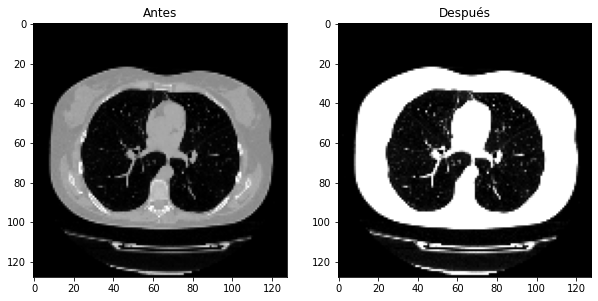

In [50]:
index_ct = 0
imagen_pre_aug = images[index_ct]
label_imagen_pre_aug = labels[index_ct]
img_aug = augmentor(imagen_pre_aug)
#img_aug = augmentor(img_test)

print("Pre Shape:",images[index_ct].shape)
print("Post Shape:",img_aug.shape)
print("Label:",label_imagen_pre_aug)

print("---- Orignal")
print("Min:", imagen_pre_aug.min())
print("Max:", imagen_pre_aug.max())
print("Mean:", imagen_pre_aug.mean())
print("Sum:", imagen_pre_aug.sum())

print("---- Aumentada")
print("Min:", img_aug.min())
print("Max:", img_aug.max())
print("Mean:", img_aug.mean())
print("Sum:", img_aug.sum())

print(f"------------------------------------------- Cambió: {imagen_pre_aug.sum() != img_aug.sum()}")

# Ploteamos un slice antes y después
fig = plt.figure(figsize=(10, 10))
rows = 1
columns = 2

slice = 35
fig.add_subplot(rows, columns, 1)
plt.imshow(np.squeeze(imagen_pre_aug[:, :, slice]), cmap="gray")
plt.title("Antes")

fig.add_subplot(rows, columns, 2)
plt.imshow(np.squeeze(img_aug[:, :, slice]), cmap="gray")
plt.title("Después")

CT Volumentations Visualizado -- Etiqueta: 0
Dim: (128, 128, 64, 1)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Vol_ORI_TF_Class0_Rango-950_550.png


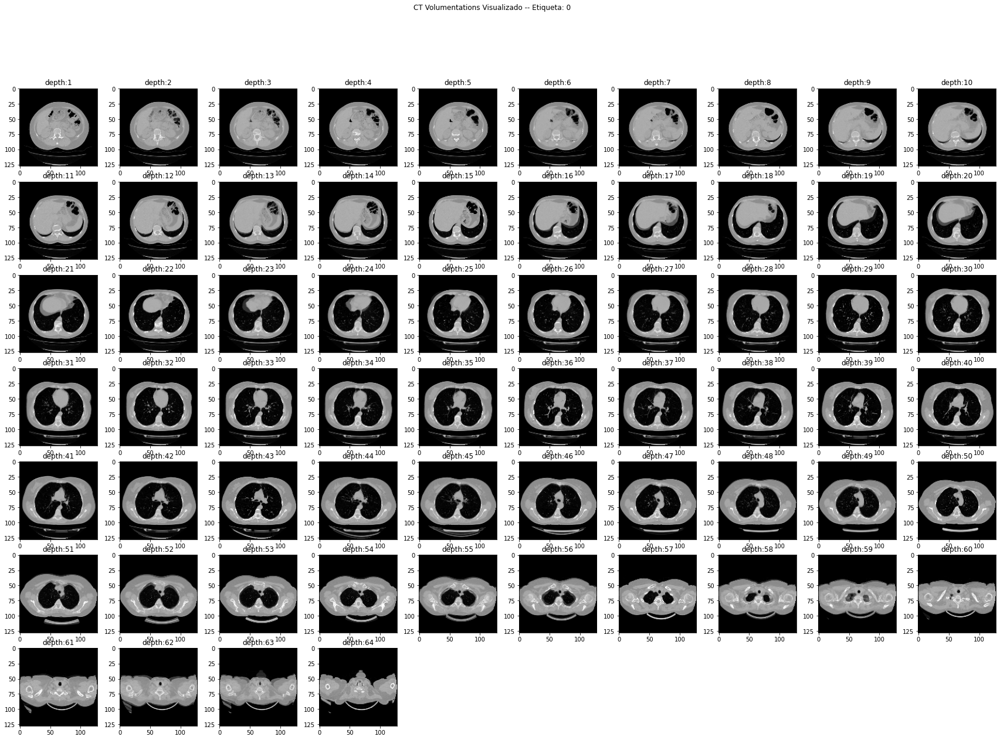

In [51]:
# Tomamos la imagen original
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label_imagen_pre_aug}"
print(mensaje)
img_print = imagen_pre_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
#img_print = img_test
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Vol_ORI_TF_Class{label_imagen_pre_aug}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

CT Volumentations Visualizado -- Etiqueta: 0
Dim: (128, 128, 64, 1)
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Vol_AUG_TF_Class0_Rango-950_550.png


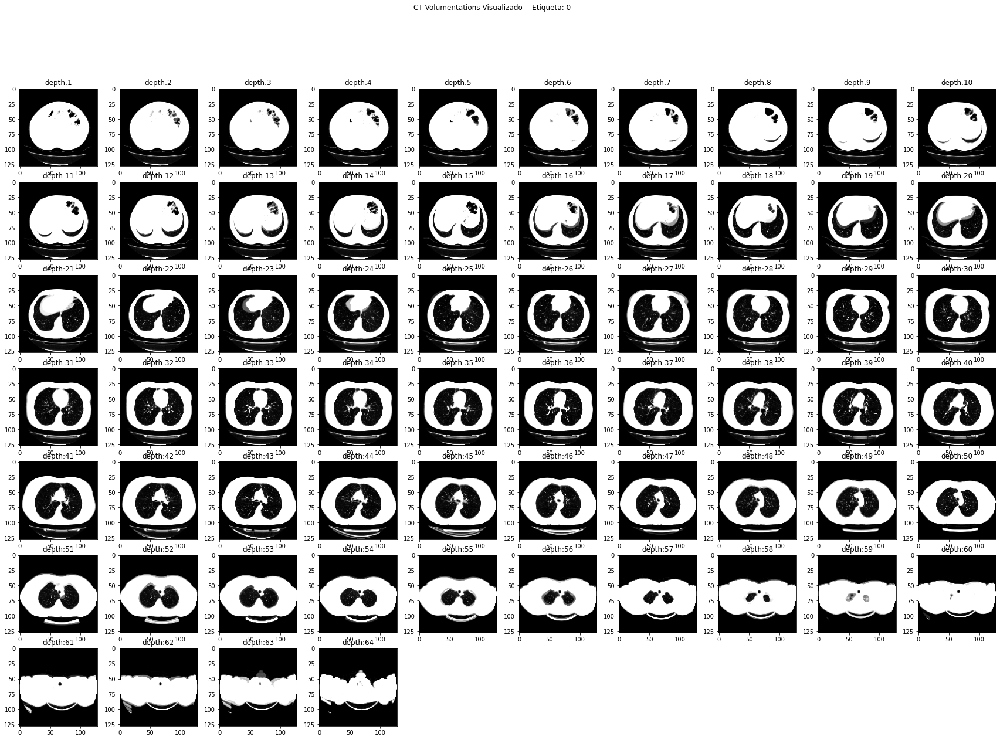

In [52]:
# Tomamos la imagen augmented 
mensaje = f"CT Volumentations Visualizado -- Etiqueta: {label_imagen_pre_aug}"
print(mensaje)
img_print = img_aug
#img_print = np.expand_dims(img_print,3)
print("Dim:",img_print.shape)
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/Vol_AUG_TF_Class{label_imagen_pre_aug}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)

# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap="gray")
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

## Prueba TF + Augmentation

In [53]:
min_ventana = -950
max_ventana = 550

In [54]:
def rotate(volume):
    # define some rotation angles
    angles = [-20, -10, -5, 5, 10, 20]
    # pick angles at random
    angle = random.choice(angles)
    # rotate volume
    volume = ndimage.rotate(volume, angle, reshape=False)
    volume[volume < 0] = 0
    volume[volume > 1] = 1
    return volume


In [55]:
def get_augmentation(patch_size):
    return Compose([
        Flip(0, p=1), # Eje X
        Flip(1, p=1), # Eje Y
        Flip(2, p=1), # Eje Z
        GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        ColorJitter(brightness=(1,3),contrast=(0.4,0.8),saturation=0,hue=0, p=1), 
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



In [56]:
def load_arrays(path):
    print(path.numpy().decode())
    # Lectura CT
    image_ = nib.load(path.numpy().decode())

    # Convertirlo en array
    image_ = image_.get_fdata()

    # Aplicar función normalización
    image = normalize(image_, min_normalize=min_ventana, max_normalize=max_ventana) 

    # Aplicar función de estandarización número de cortes y rotación 90 grados
    image = resize_volume(image)[..., None] #Agregar dimensión grises

    # Implementar rotación:
    image = rotate(image)

    # Implementar data augmentation
    image = augmentor(image)

    # Limitando valores entre 0-1
    image = tf.clip_by_value(image, clip_value_min = 0, clip_value_max = 1)

    return image#.reshape(image_.shape+(1,))

def tf_data_array(filenames1, labels):
    [image,] = tf.py_function(func= load_arrays,  inp=[filenames1], Tout=[tf.float32])
    image.set_shape((128,128,64,1))
    #labels.set_shape(label.shape)
    return image,  labels

In [59]:
BATCH_SIZE=2
RANDOM = 9411
def datasets_iteration(dataset_row, training=False):
    filename = dataset_row['path']
    labels = dataset_row['Label']
    dataset = tf.data.Dataset.from_tensor_slices((filename,labels))
    
    print(dataset)
    
    if training:
        dataset = dataset.shuffle(len(dataset_row),seed=RANDOM)
    
    #Aplicamos todas las funciones de pre-procesamiento    
    #dataset = dataset.map(tf_data_array).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    #dataset = dataset.map(tf_data_array).cache().batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    dataset = dataset.map(tf_data_array, num_parallel_calls = 4).batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE) # https://stackoverflow.com/questions/59228816/what-do-the-tensorflow-datasets-functions-cache-and-prefetch-do
    # https://stackoverflow.com/questions/63796936/what-is-the-proper-use-of-tensorflow-dataset-prefetch-and-cache-options
    # https://cs230.stanford.edu/blog/datapipeline/#best-practices
    return dataset

In [60]:
train_dataset = datasets_iteration(valid_df)

<TensorSliceDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


In [61]:
# data = train_dataset.take(-1) # Tomamos todos los batchs
# data2 = list(data)

In [62]:
# images, labels = data2[13] # Se escoge el batch 13 porque en el print anterior se ve que es donde podemos encontrar un 0 y 1 en etiquetas.
# images = images.numpy()

In [64]:
data = train_dataset.take(1) # Tomamos primer batch
data2 = list(data)

images, labels = data2[0]
images = images.numpy()

G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0180.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0075.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0026.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0031.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0139.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0100.nii.gz
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0092.nii.gz


In [65]:
images[0].max()

0.7618575

CT Etiqueta: 0 
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/TF_VF_Index0_Rango-950_550.png


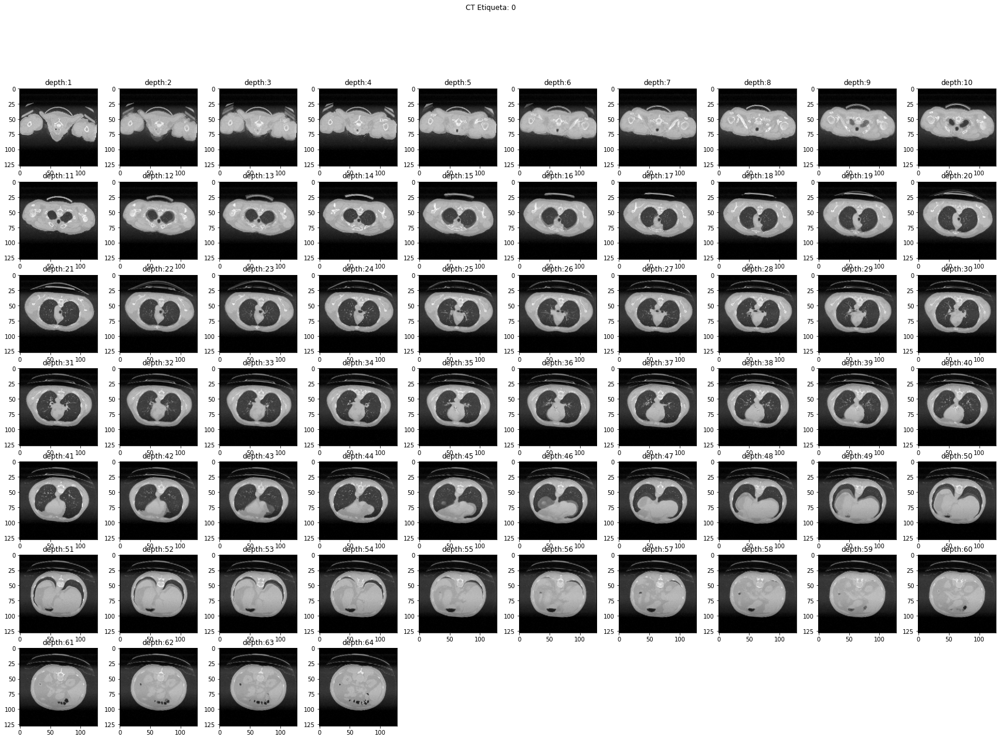

In [66]:
index_ct = 0 # Escoger una imagen del batch
mensaje = f"CT Etiqueta: {labels.numpy()[index_ct]} "
print(mensaje)
img_print = images[index_ct]
label_print = labels.numpy()[index_ct]
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/TF_VF_Index{index_ct}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)


# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap='gray')
plt.suptitle(mensaje)
#plt.savefig(file_image_path)
plt.show()

CT Etiqueta: 0 
G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/TF_VF_Index1_Rango-950_550.png


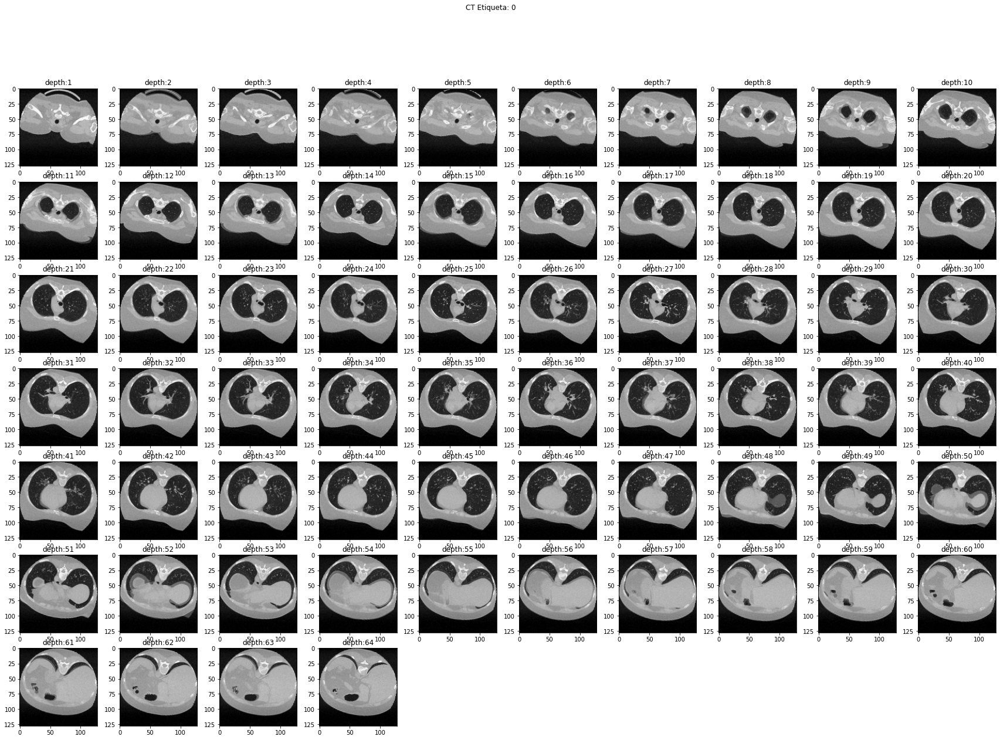

In [67]:
index_ct = 1
mensaje = f"CT Etiqueta: {labels.numpy()[index_ct]} "
print(mensaje)
img_print = images[index_ct]
label_print = labels.numpy()[index_ct]
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/TF_VF_Index{index_ct}_Rango{min_ventana}_{max_ventana}.png'
print(file_image_path)


# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap='gray')
plt.suptitle(mensaje)
#plt.savefig(file_image_path)
plt.show()

# Pruebas 2D

In [2]:
min_ventana = -950
max_ventana = 550

In [3]:
def read_nifti_file(filepath):
    """Read and load volume"""
    # Read file
    scan = nib.load(filepath)
    # Get raw data
    scan = scan.get_fdata()
    return scan


def normalize(volume, min_normalize, max_normalize):
    """Normalize the volume"""
    min = min_normalize #-1000
    max = max_normalize #400
    volume[volume < min] = min
    volume[volume > max] = max
    volume = (volume - min) / (max - min)
    volume = volume.astype("float32")
    return volume


def resize_volume(img):
    """Resize across z-axis"""
    # Set the desired depth
    desired_depth = 1
    desired_width = 128
    desired_height = 128
    # Get current depth
    current_depth = img.shape[-1]
    current_width = img.shape[0]
    current_height = img.shape[1]
    # Compute depth factor
    depth = current_depth / desired_depth
    width = current_width / desired_width
    height = current_height / desired_height
    depth_factor = 1 / depth
    width_factor = 1 / width
    height_factor = 1 / height
    # Rotate
    img = ndimage.rotate(img, 90, reshape=False)
    # Resize across z-axis
    img = ndimage.zoom(img, (width_factor, height_factor, depth_factor), order=1)
    return img

def resize_volume2(img):
    """Resize across z-axis"""
    # Set the desired depth
    desired_width = 128
    desired_height = 128
    # Get current depth
    current_width = img.shape[0]
    current_height = img.shape[1]
    # Compute depth factor
    width = current_width / desired_width
    height = current_height / desired_height
    width_factor = 1 / width
    height_factor = 1 / height
    # Rotate
    img = ndimage.rotate(img, 90, reshape=False)
    # Resize across z-axis
    img = ndimage.zoom(img, (width_factor, height_factor), order=1)
    return img


def process_scan(path, min_normalize, max_normalize):
    """Read and resize volume"""
    # Read scan
    volume = read_nifti_file(path)
    # Normalize
    volume = normalize(volume, min_normalize=min_normalize, max_normalize=max_normalize)
    # Resize width, height and depth
    volume = resize_volume(volume)
    return volume


## Resize sobre el eje z

In [11]:
pathh = valid_df['path'][27]
pathh

'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-2/study_0996.nii.gz'

In [71]:
prueba_imagen_2d_1 = process_scan(pathh, min_ventana, max_ventana)

(128, 128, 1)


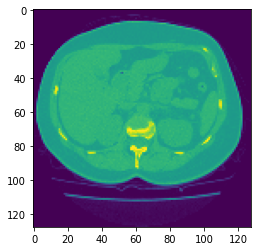

In [72]:
print(prueba_imagen_2d_1.shape)
plt.imshow(prueba_imagen_2d_1)

## Resize

In [73]:
prueba_imagen_2d_2 = read_nifti_file(pathh)
print(prueba_imagen_2d_2.shape)

# Normalize
prueba_imagen_2d_2 = normalize(prueba_imagen_2d_2, min_normalize=min_ventana, max_normalize=max_ventana)
print(prueba_imagen_2d_2.shape)

# Reshape
prueba_imagen_2d_2 = prueba_imagen_2d_2.reshape(prueba_imagen_2d_2.shape[0], (prueba_imagen_2d_2.shape[1]*prueba_imagen_2d_2.shape[2]))
print(prueba_imagen_2d_2.shape)

(512, 512, 41)
(512, 512, 41)
(512, 20992)


(512, 20992)


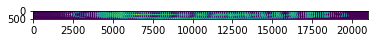

In [74]:
print(prueba_imagen_2d_2.shape)
plt.imshow(prueba_imagen_2d_2)

## Suma

In [38]:
prueba_imagen_2d_3 = read_nifti_file(pathh)
print(prueba_imagen_2d_3.shape)

# Normalize
prueba_imagen_2d_3 = normalize(prueba_imagen_2d_3, min_normalize=min_ventana, max_normalize=max_ventana)
print(prueba_imagen_2d_3.shape)

# Reshape
prueba_imagen_2d_3 = np.sum(prueba_imagen_2d_3,axis=-1)
print(prueba_imagen_2d_3.shape)

# Zoom
prueba_imagen_2d_3 = resize_volume2(prueba_imagen_2d_3)#[..., None]
print(prueba_imagen_2d_3.shape)

(512, 512, 41)
(512, 512, 41)
(512, 512)
(128, 128)


(128, 128)


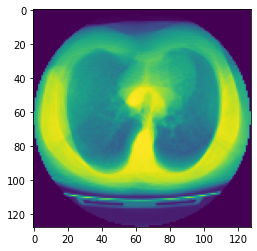

In [39]:
print(prueba_imagen_2d_3.shape)
plt.imshow(prueba_imagen_2d_3)

In [40]:
prueba_imagen_2d_3 = read_nifti_file(pathh)
print(prueba_imagen_2d_3.shape)

# Reshape
prueba_imagen_2d_3 = np.sum(prueba_imagen_2d_3,axis=-1)
print(prueba_imagen_2d_3.shape)

# Normalize
prueba_imagen_2d_3 = normalize(prueba_imagen_2d_3, min_normalize=min_ventana, max_normalize=max_ventana)
print(prueba_imagen_2d_3.shape)

# Zoom
prueba_imagen_2d_3 = resize_volume2(prueba_imagen_2d_3)#[..., None]
print(prueba_imagen_2d_3.shape)

(512, 512, 41)
(512, 512)
(512, 512)
(128, 128)


(128, 128)


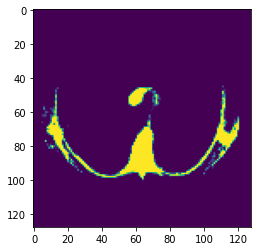

In [41]:
print(prueba_imagen_2d_3.shape)
plt.imshow(prueba_imagen_2d_3)

## Media

In [81]:
prueba_imagen_2d_4 = read_nifti_file(pathh)
print(prueba_imagen_2d_4.shape)

# Normalize
prueba_imagen_2d_4 = normalize(prueba_imagen_2d_4, min_normalize=min_ventana, max_normalize=max_ventana)
print(prueba_imagen_2d_4.shape)

# Reshape
prueba_imagen_2d_4 = np.mean(prueba_imagen_2d_4,axis=-1)
print(prueba_imagen_2d_4.shape)

# Zoom
prueba_imagen_2d_4 = resize_volume2(prueba_imagen_2d_4)
print(prueba_imagen_2d_4.shape)

(512, 512, 41)
(512, 512, 41)
(512, 512)
(128, 128)


(128, 128)


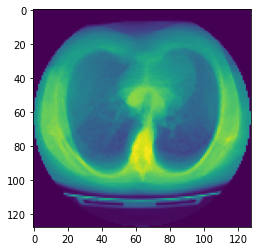

In [82]:
print(prueba_imagen_2d_4.shape)
plt.imshow(prueba_imagen_2d_4)

## Data augmentation

In [ ]:
def rotate(volume):
    # define some rotation angles
    angles = [-20, -10, -5, 5, 10, 20]
    # pick angles at random
    angle = random.choice(angles)
    # rotate volume
    volume = ndimage.rotate(volume, angle, reshape=False)
    volume[volume < 0] = 0
    volume[volume > 1] = 1
    return volume


In [ ]:
def get_augmentation(patch_size):
    return Compose([
        Flip(0, p=1), # Eje X
        Flip(1, p=1), # Eje Y
        Flip(2, p=1), # Eje Z
        GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        ColorJitter(brightness=(1,3),contrast=(0.4,0.8),saturation=0,hue=0, p=1), 
    ], p=1)

def augmentor(img):
    aug = get_augmentation((128,128,64))
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    return np.ndarray.astype(img , np.float32)



In [ ]:
def load_arrays(path):
    print(path.numpy().decode())
    # Lectura CT
    image_ = nib.load(path.numpy().decode())

    # Convertirlo en array
    image_ = image_.get_fdata()

    # Aplicar función normalización
    image = normalize(image_, min_normalize=min_ventana, max_normalize=max_ventana) 

    # Aplicar función de estandarización número de cortes y rotación 90 grados
    image = resize_volume(image)[..., None] #Agregar dimensión grises

    # Implementar rotación:
    image = rotate(image)

    # Implementar data augmentation
    image = augmentor(image)

    # Limitando valores entre 0-1
    image = tf.clip_by_value(image, clip_value_min = 0, clip_value_max = 1)

    return image#.reshape(image_.shape+(1,))

def tf_data_array(filenames1, labels):
    [image,] = tf.py_function(func= load_arrays,  inp=[filenames1], Tout=[tf.float32])
    image.set_shape((128,128,64,1))
    #labels.set_shape(label.shape)
    return image,  labels

In [ ]:
BATCH_SIZE=2
RANDOM = 9411
def datasets_iteration(dataset_row, training=False):
    filename = dataset_row['path']
    labels = dataset_row['Label']
    dataset = tf.data.Dataset.from_tensor_slices((filename,labels))
    
    print(dataset)
    
    if training:
        dataset = dataset.shuffle(len(dataset_row),seed=RANDOM)
    
    #Aplicamos todas las funciones de pre-procesamiento    
    #dataset = dataset.map(tf_data_array).batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    #dataset = dataset.map(tf_data_array).cache().batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)
    dataset = dataset.map(tf_data_array).batch(BATCH_SIZE).cache().prefetch(tf.data.AUTOTUNE)
    return dataset

In [ ]:
test_2d = datasets_iteration(valid_df.iloc[[24,25,26]])

<TensorSliceDataset element_spec=(TensorSpec(shape=(), dtype=tf.string, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>


## Prueba Resize

In [177]:
def read_nifti_file(filepath):
    """Read and load volume"""
    # Read file
    scan = nib.load(filepath)
    # Get raw data
    scan = scan.get_fdata()
    return scan


def normalize(volume, min_normalize, max_normalize):
    """Normalize the volume"""
    min = min_normalize #-1000
    max = max_normalize #400
    volume[volume < min] = min
    volume[volume > max] = max
    volume = (volume - min) / (max - min)
    volume = volume.astype("float32")
    return volume


def resize_volume(img):
    """Resize across z-axis"""
    # Set the desired depth
    desired_depth = 64
    desired_width = 128
    desired_height = 128
    # Get current depth
    current_depth = img.shape[-1]
    current_width = img.shape[0]
    current_height = img.shape[1]
    # Compute depth factor
    depth = current_depth / desired_depth
    width = current_width / desired_width
    height = current_height / desired_height
    depth_factor = 1 / depth
    width_factor = 1 / width
    height_factor = 1 / height
    # Rotate
    img = ndimage.rotate(img, 90, reshape=False)
    # Resize across z-axis
    img = ndimage.zoom(img, (width_factor, height_factor, depth_factor), order=1)
    return img


def process_scan(path, min_normalize, max_normalize):
    """Read and resize volume"""
    # Read scan
    volume = read_nifti_file(path)
    # Normalize
    volume = normalize(volume, min_normalize=min_normalize, max_normalize=max_normalize)
    # Resize width, height and depth
    volume = resize_volume(volume)
    return volume


In [168]:
pathh = valid_df['path'][0]
export_name = pathh.rsplit('/',1)[1].replace(".nii.gz","")
pathh

'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Real/CT-0/study_0026.nii.gz'

In [169]:
imagen_original = read_nifti_file(pathh)
imagen_original = normalize(imagen_original, min_normalize=min_ventana, max_normalize=max_ventana)

G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/study_0026_Prueba_Resize_CT_Ori.png


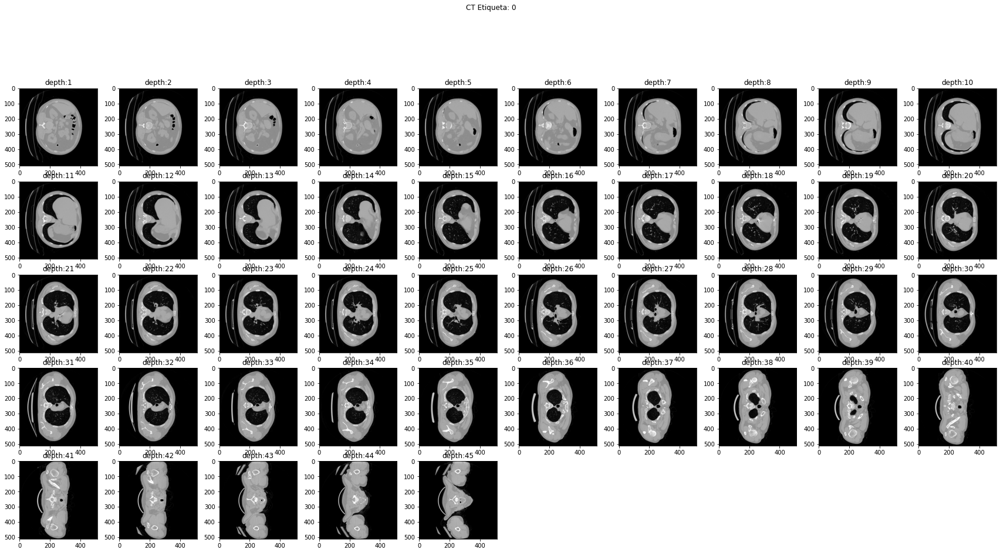

In [170]:
img_print = imagen_original
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/{export_name}_Prueba_Resize_CT_Ori.png'
print(file_image_path)


# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap='gray')
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

### Función zoom

In [178]:
imagen_nueva_zoom = resize_volume(imagen_original)

G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/study_0026_Prueba_Resize_CT_Zoomed.png


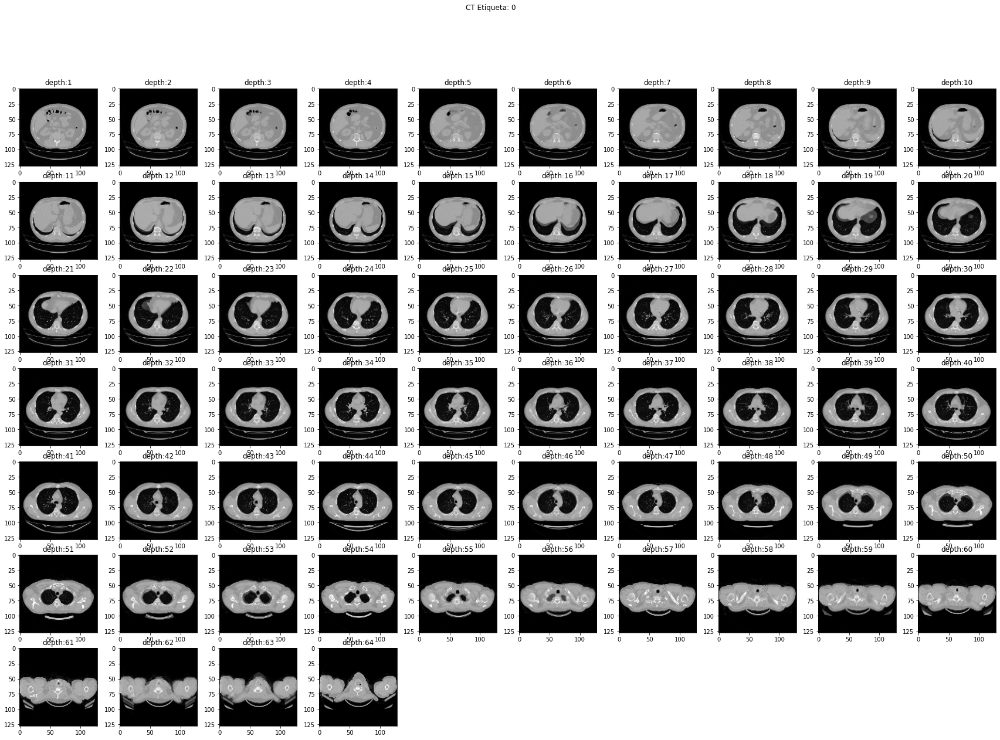

In [179]:
img_print = imagen_nueva_zoom
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/{export_name}_Prueba_Resize_CT_Zoomed.png'
print(file_image_path)


# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap='gray')
plt.suptitle(mensaje)
plt.savefig(file_image_path)
plt.show()

### Prueba Volumentations

In [131]:
import volumentations as V

In [165]:
def get_augmentation():
    return Compose([
        #Flip(0, p=1), # Eje X
        #Flip(1, p=1), # Eje Y
        #Flip(2, p=1), # Eje Z
        #GaussianNoise(var_limit=(0.0001, 0.0005), p=1),
        
        #ColorJitter(brightness=(2,5),p = 1),
        #ColorJitter(contrasat=(2,7),p = 1),
        #ColorJitter(brightness=(1,5),contrast=(0.4,0.8),saturation=0,hue=0, p=1), 
        #RandomGamma(gamma_limit=(20, 30), p=1),
        Resize((128,128,64), interpolation=1, resize_type=0, always_apply=True, p=1.0),
        #Rotate((0,0), (90,90), (0,0) , p=1),
    ], p=1)

def augmentor(img):
    aug = get_augmentation()
    data = {'image': img}
    aug_data = aug(**data)
    img = aug_data['image']
    #img = ndimage.rotate(img, 90, reshape=False)
    return np.ndarray.astype(img , np.float32)



In [166]:
imagen_nueva_aug = augmentor(imagen_original)
imagen_nueva_aug.shape

(128, 128, 64)

G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/study_0996_Prueba_Resize_CT_Aug.png


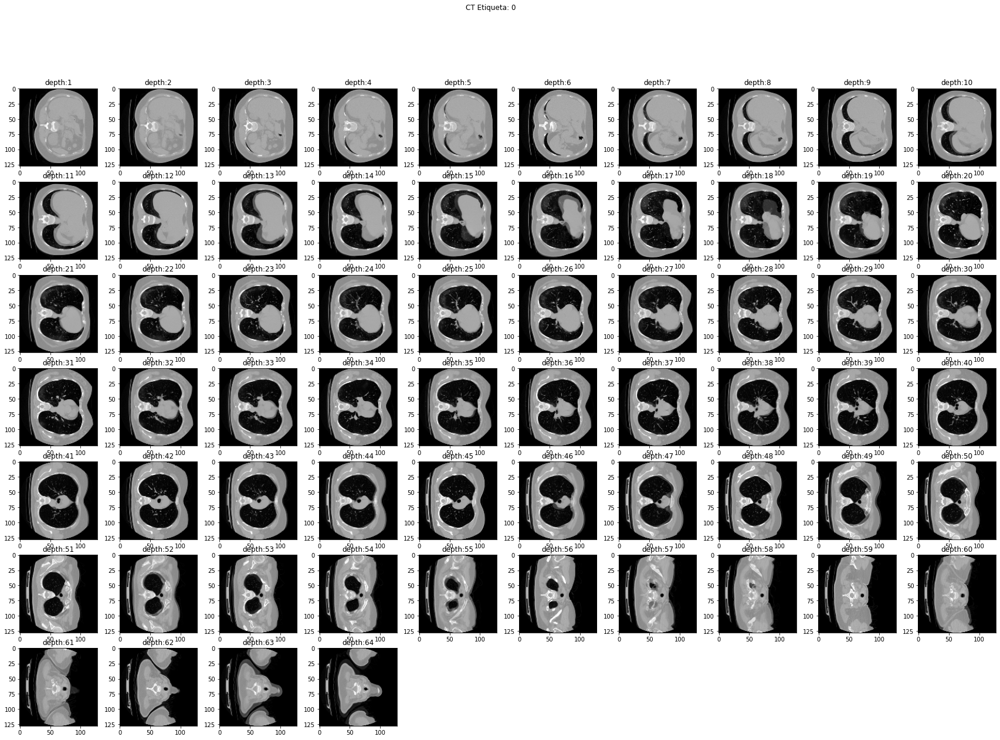

In [167]:
img_print = imagen_nueva_aug
fig = plt.figure(figsize=(30, 20))
columns = 10
rows = 7
depth_img = img_print.shape[2]

file_image_path = f'G:/Mi unidad/Maestria/Tesis/Bayesian_NN/Data/Imgs/{export_name}_Prueba_Resize_CT_Aug.png'
print(file_image_path)


# ax enables access to manipulate each of subplots
ax = []

for i in range(1, depth_img+1):
    img = np.squeeze(img_print[:, :, i-1])
    #fig.add_subplot(rows, columns, i)
    ax.append( fig.add_subplot(rows, columns, i))
    ax[-1].set_title("depth:"+str(i))  # set title
    plt.imshow(img, cmap='gray')
plt.suptitle(mensaje)
#plt.savefig(file_image_path)
plt.show()